Install open street maps and then import the other nessassary packages

In [ ]:
%pip install osmnx
%pip install geopandas
%pip install matplotlib
%pip install shapely
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry.polygon import Polygon



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 2.6 MB/s eta 0:00:00


Load a Country or City as a geodataframe and project it onto a plot

Notice the _ =

Python automatically stores the value of the last expression in the interpreter to a particular variable called "_."





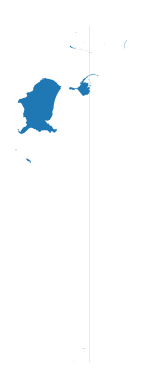

In [ ]:
import osmnx as ox
country = ox.geocode_to_gdf('United States')
ax = ox.project_gdf(country).plot()
_ = ax.axis('off')


Same thing here but with a list

<ipython-input-7-3b7472ae2298>:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  places.to_file('s-africa')


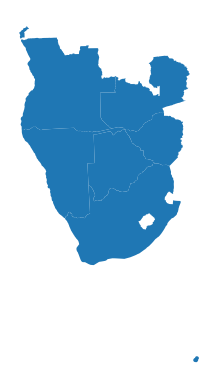

In [ ]:
places = ox.geocode_to_gdf(['Botswana', 'Angola', 'Zambia', 'South Africa', 'Zimbabwe', 'Namibia'])
places = ox.project_gdf(places)
places.to_file('s-africa')
ax = places.plot()
_ = ax.axis('off')


Produce a street network from a bounding box  (north, south, east, west)

You can also simply type the name of a location. But for many cities (e.g., Austin, NYC) it takes a long time to load.

<ipython-input-9-8f17867f115f>:1: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G = ox.graph_from_bbox(30.29, 30.27, -97.72, -97.75, network_type='drive')
<ipython-input-9-8f17867f115f>:1: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G = ox.graph_from_bbox(30.29, 30.27, -97.72, -97.75, network_type='drive')


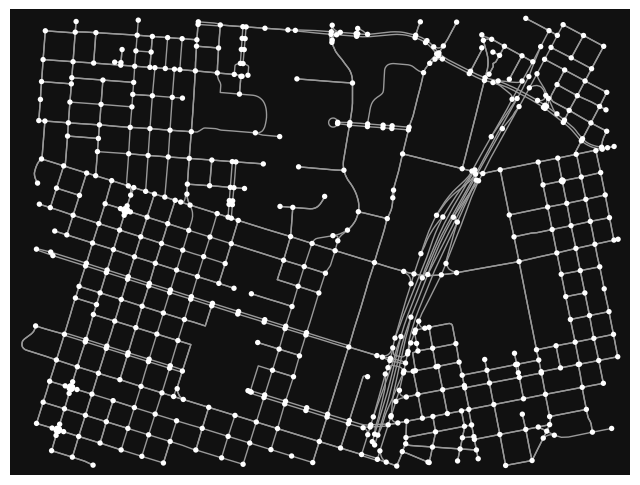

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
G = ox.graph_from_bbox(30.29, 30.27, -97.72, -97.75, network_type='drive')
G_projected = ox.project_graph(G)
ox.plot_graph(G_projected)

Filter to find restaurants in Austin using the geometries_from_place function

https://wiki.openstreetmap.org/wiki/Key:amenity

In [ ]:
# List key-value pairs for tags
tags = {'amenity': 'restaurant'}

# Retrieve restaurants
restaurants = ox.geometries_from_place('Austin, Texas', tags)

# How many restaurants do we have?
len(restaurants)

<ipython-input-14-b3f210d5834f>:5: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  restaurants = ox.geometries_from_place('Austin, Texas', tags)


1052

Check to see what columns are associated with restaruants

In [ ]:
# Available columns
restaurants.columns.values

array(['amenity', 'created_by', 'name', 'geometry', 'cuisine',
       'addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'opening_hours', 'wheelchair', 'website', 'addr:state',
       'addr:unit', 'air_conditioning', 'check_date', 'contact:facebook',
       'diet:vegetarian', 'email', 'outdoor_seating', 'payment:cash',
       'payment:discover_card', 'payment:mastercard', 'payment:visa',
       'phone', 'smoking', 'takeaway', 'description', 'contact:phone',
       'microbrewery', 'addr:country', 'alt_name', 'brand',
       'brand:wikidata', 'delivery', 'toilets:wheelchair', 'diet:vegan',
       'shop', 'source', 'wikidata', 'wikipedia', 'leisure',
       'diet:gluten_free', 'diet:keto', 'diet:lowcarb', 'diet:paleo',
       'start_date', 'addr:housename', 'diet:halal', 'diet:kosher',
       'indoor_seating', 'check_date:currency:XBT', 'currency:XBT',
       'payment:lightning', 'payment:lightning_contactless',
       'payment:onchain', 'survey:date', 'branch', 'disu

Look at some of the columns

In [ ]:
# Select some useful cols and print
cols = ['name', 'opening_hours', 'addr:city', 'addr:country',
        'addr:housenumber', 'addr:postcode', 'addr:street']

# Print only selected cols
restaurants[cols].head(100)

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo

name  \
element_type osmid                                     
node         358532482                     La Palapa   
             358669465             China Star Buffet   
             358693667                    Pappadeaux   
             359344991                    Pappasitos   
             359354860                   Japon Sushi   
...                                              ...   
             1257587558  Southside Market & Barbeque   
             1431503598                    Juiceland   
             1431507585               House Pizzeria   
             1477370206   Vazquez Mexican Restaurant   
             1477370208                    Pizza Hut   

                                                             opening_hours  \
element_type osmid                                                           
node         358532482                                                 NaN   
             358669465                                                 NaN   
             358693667                                                 NaN   
             359344991                                                 NaN   
             359354860                                                 NaN   
...                                                                    ...   
             1257587558                                                NaN   
             1431503598                                                NaN   
             1431507585                                                NaN   
             1477370206  Mo,Tu 06:00-15:00; We-Fr 06:00-21:00; Sa 07:00...   
             1477370208                                                NaN   

                        addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                              
node         358532482        NaN          NaN              NaN           NaN   
             358669465        NaN          NaN              NaN           NaN   
             358693667        NaN          NaN              NaN           NaN   
             359344991        NaN          NaN              NaN           NaN   
             359354860        NaN          NaN              NaN           NaN   
...                           ...          ...              ...           ...   
             1257587558       NaN          NaN              NaN           NaN   
             1431503598       NaN          NaN             4500         78751   
             1431507585    Austin          NaN             5111         78751   
             1477370206    Austin          NaN              915         78753   
             1477370208    Austin          NaN             1015         78753   

                               addr:street  
element_type osmid                          
node         358532482                 NaN  
             358669465                 NaN  
             358693667                 NaN  
             359344991                 NaN  
             359354860                 NaN  
...                                    ...  
             1257587558                NaN  
             1431503598           Duval St  
             1431507585  Airport Boulevard  
             1477370206   East Braker Lane  
             1477370208   East Braker Lane  

[100 rows x 7 columns]

Let's make a cool looking map!

In [ ]:
# define a bounding box
north, south, east, west = 30.29, 30.27, -97.72, -97.75

#convert the bounding box to a polygon
poly = ox.utils_geo.bbox_to_poly(north, south, east, west)

#convert the polygon to a geo data frame
region = gpd.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[poly])

#building: True means that every type of buildings will be downloaded
buildings = ox.features_from_bbox(north, south, east, west, tags = {'building': True})

#Using graph module we will recieve graph of roads in the city
roads = ox.graph.graph_from_bbox(north, south, east, west)

#Here we specify specific tags
rivers = ox.features_from_bbox(north, south, east, west, tags = {'waterway': True})
parks = ox.features_from_bbox(north, south, east, west, tags = {'leisure': 'park'})
univeristy = ox.features_from_bbox(north, south, east, west, tags = {'amenity': 'university'})



<ipython-input-17-cccaf067dfba>:5: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. Note that the expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  poly = ox.utils_geo.bbox_to_poly(north, south, east, west)
<ipython-input-17-cccaf067dfba>:11: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  buildings = ox.features_from_bbox(north, south, east, west, tags = {'building': True})
<ipython-input-17-cccaf067dfba>:11: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  buildings = ox.fea

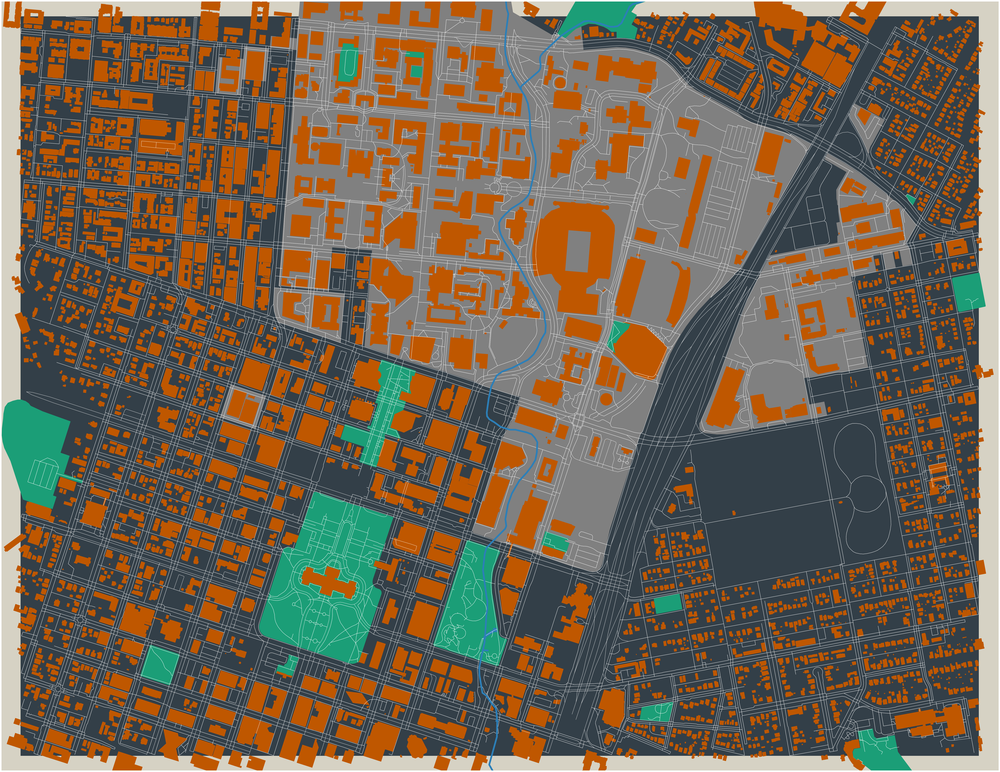

In [ ]:
#city
ax = region.plot(facecolor = '#333f48', figsize=(85,85))
ax.set_facecolor('#d6d2c4')

univeristy.plot(facecolor = 'grey',
            edgecolor = 'grey',
            linewidth = 2,
            markersize = 1,
            ax = ax)

buildings['geometry'].plot(facecolor = '#bf5700',
                           edgecolor = '#bf5700',
                           linewidth = 1,
                           markersize = 1,
                           ax = ax)

parks.plot(facecolor = '#1b9e77',
            edgecolor = '#1b9e77',
            linewidth = 2,
            markersize = 1,
            ax = ax)

rivers.plot(edgecolor = '#2c7fb8',
            linewidth = 8,
            linestyle = '-',
            ax = ax)

ox.plot_graph(roads,
              edge_color = 'white',
              node_color = 'white',
              edge_linewidth=1,
              node_size = 1,
              ax=ax)

ax.grid('on', which='major', axis='x', color = '#99A2A2')
ax.grid('on', which='major', axis='y', color = '#99A2A2')
plt.show()
